<a href="https://colab.research.google.com/github/Udbhavbisarya23/Table_Detection_Structure_Recogntion/blob/main/IT416_Course_Project_TrackB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.8 torchvision -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 763.5 MB 16 kB/s 
     |████████████████████████████████| 23.3 MB 1.6 MB/s 
     |████████████████████████████████| 22.1 MB 1.4 MB/s 
     |████████████████████████████████| 22.1 MB 1.6 MB/s 
     |████████████████████████████████| 17.3 MB 1.7 MB/s 
     |████████████████████████████████| 17.4 MB 25.0 MB/s 
     |████████████████████████████████| 17.3 MB 777 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dep

In [ ]:
# install detectron2:
# !pip install fvcore==0.1.1.dev200512
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
     |████████████████████████████████| 6.3 MB 776 kB/s 
     |████████████████████████████████| 130 kB 5.3 MB/s 
     |████████████████████████████████| 106 kB 40.0 MB/s 
     |████████████████████████████████| 145 kB 31.2 MB/s 
     |████████████████████████████████| 74 kB 3.3 MB/s 
     |████████████████████████████████| 49 kB 5.1 MB/s 
     |████████████████████████████████| 843 kB 33.1 MB/s 
     |████████████████████████████████| 749 kB 41.1 MB/s 
     |████████████████████████████████| 112 kB 47.0 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20211023-py3-none-any.whl size=60947 sha256=d18c80697e1dc31fd40528661fde789b5836247ab731ba3e787aab2556f432ca
  Stored in directory: /root/.cache/pip/wheels/16/98/fc/252d62cab6263c719120e06b28f3378af59b52ce7a20e81852
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=2f32d

In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# import some common detectron2 utilitiesAttempting to copy inputs of <function pairwise_iou at 0x7fdd4d757680> to CPU due to CUDA OOM
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# # !/usr/bin/python

# # pip install lxml

import sys
import os
import json
import xml.etree.ElementTree as ET
import glob
import detectron2
import random
from detectron2 import structures
from detectron2.structures import BoxMode

START_BOUNDING_BOX_ID = 1
PRE_DEFINE_CATEGORIES = None


def ground_truth_to_COCO_B(xml_files):
    import cv2
    final = {}
    final["categories"] = [{
        "id": 0,
        "name": "table",
        "supercategory": "none"
    }]
    dataset = []
    img_dir_path = '/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/ground_truth/images/'
    count = 0
    for xmlfile in xml_files:
        tree = ET.parse(xmlfile)
        root = tree.getroot()
        print(root.attrib['filename'])
        im = cv2.imread(os.path.join(img_dir_path + root.attrib['filename']))
        objs = []
        for table in root:
            for element in table:
                # Table coordinates
                obj = {}
                if element.tag == 'Coords':
                  coords = element.attrib['points'].split(" ")
                  temp = []
                  for ele in coords:
                      x,y = ele.split(",")
                      x,y = int(x), int(y)
                      temp.append(x)
                      temp.append(y)
                  obj = {
                      "bbox": [temp[0], temp[1], temp[4], temp[5]],
                      "bbox_mode": BoxMode.XYXY_ABS,
                      "segmentation": [temp],
                      "category_id": 0,
                      "iscrowd": 0
                  }
                else:
                  for coord in element:
                    coords = coord.attrib['points'].split(" ")
                    temp = []
                    tempxarr = []
                    tempyarr = []
                    for ele in coords:
                        x,y = ele.split(",")
                        x,y = int(x), int(y)
                        temp.append(x)
                        temp.append(y)
                        tempxarr.append(x)
                        tempyarr.append(y)
                    obj = {
                      "bbox": [int(np.min(tempxarr)), int(np.min(tempyarr)), int(np.max(tempxarr)), int(np.max(tempyarr))],
                      "bbox_mode": BoxMode.XYXY_ABS,
                      "segmentation": [temp],
                      "category_id": 1,
                      "iscrowd": 0
                    }
                objs.append(obj)
        
        dataset.append({
            "file_name": os.path.join(img_dir_path,root.attrib['filename']),
            "image_id": count,
            "height": im.shape[0],
            "width": im.shape[1],
            "annotations": objs
        })
        
        count += 1
    
    return dataset




xml_files = glob.glob(os.path.join('/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/ground_truth/annotations', "*.xml"))
# If you want to do train/test split, you can pass a subset of xml files to convert function.
random.shuffle(xml_files)
print(len(xml_files))
val_dataset = ground_truth_to_COCO_B(xml_files[540:])

json_file = '/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/coco/val.json'

os.makedirs(os.path.dirname(json_file), exist_ok=True)
json_fp = open(json_file, "w")

print(val_dataset)
json_str = json.dumps(val_dataset)
json_fp.write(json_str)
json_fp.close()


train_dataset = ground_truth_to_COCO_B(xml_files[:540])

json_file = '/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/coco/train.json'

os.makedirs(os.path.dirname(json_file), exist_ok=True)
json_fp = open(json_file, "w")
json_str = json.dumps(train_dataset)
json_fp.write(json_str)
json_fp.close()

#Registering the dataset

In [ ]:
# When dataset isnt exactly in COCO format
from detectron2.structures import BoxMode
import json, os
from detectron2.data import MetadataCatalog, DatasetCatalog

def get_board_dicts(imgdir):
    json_file = "/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/coco/" + imgdir + ".json"
    with open(json_file) as f:
        dataset_dicts = json.load(f)
    for i in dataset_dicts:
        filename = i["file_name"] 
        for j in i["annotations"]:
            j["bbox_mode"] = BoxMode.XYXY_ABS
            label = j["category_id"]
    return dataset_dicts


for d in ["train", "val"]:
    try:
      DatasetCatalog.register(d, lambda d=d: get_board_dicts(d))
      MetadataCatalog.get(d).set(thing_classes=["Table","Cell"])
    except:
      print("Registered")
      continue

main_metadata = MetadataCatalog.get("train")
print(main_metadata)

Metadata(name='train', thing_classes=['Table', 'Cell'])


In [ ]:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("coco_train", {}, "/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/coco/train.json", "/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/ground_truth/images")
# register_coco_instances("coco_val", {}, "/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/coco/val.json", "/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/ground_truth/images")

{'file_name': '/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/ground_truth/images/cTDaR_t00091.jpg', 'image_id': 481, 'height': 3510, 'width': 4544, 'annotations': [{'bbox': [180, 160, 4354, 3287], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[180, 160, 4354, 160, 4354, 3287, 180, 3287]], 'category_id': 0, 'iscrowd': 0}, {'bbox': [177, 160, 615, 456], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[180, 160, 177, 456, 614, 456, 615, 163]], 'category_id': 1, 'iscrowd': 0}, {'bbox': [614, 163, 1041, 456], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[615, 163, 614, 456, 1038, 456, 1041, 167]], 'category_id': 1, 'iscrowd': 0}, {'bbox': [1038, 167, 1420, 467], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[1041, 167, 1038, 456, 1418, 467, 1420, 171]], 'category_id': 1, 'iscrowd': 0}, {'bbox': [1418, 171, 1731, 467], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[1420, 171, 1418, 467, 1730, 467, 1731, 175]], 'category_id': 1, 'iscrowd': 0}, 

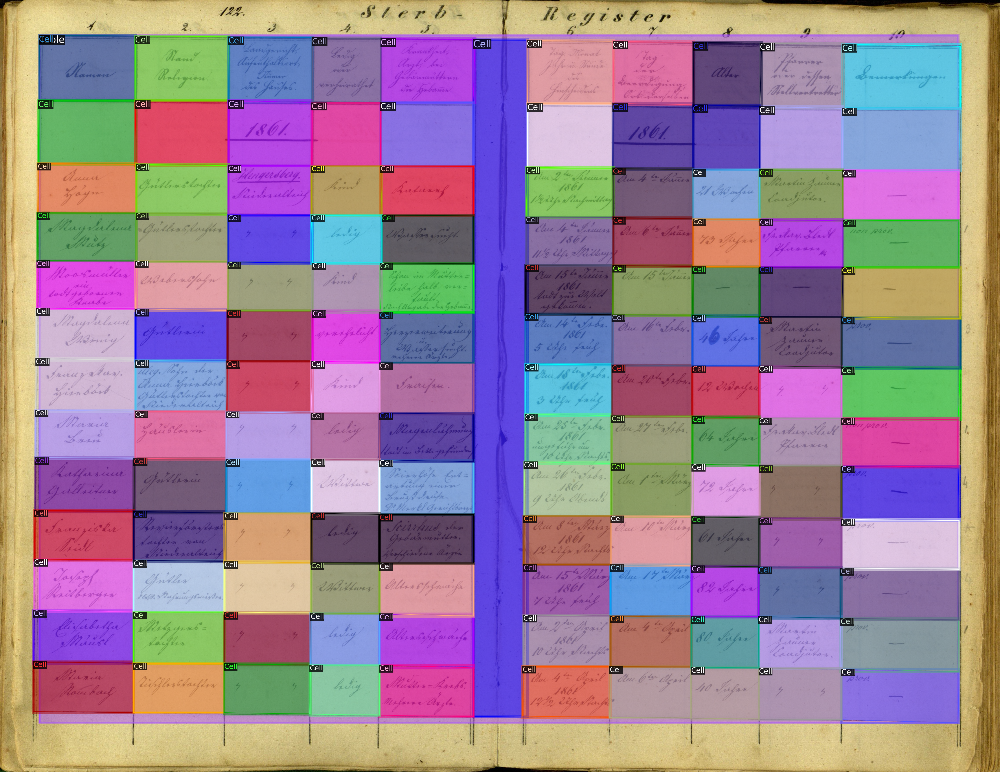

In [ ]:
import random
dataset_dicts = get_board_dicts("train")
for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    print(d)
    visualizer = Visualizer(img[:, :, ::-1], metadata=main_metadata)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

#Configuration and Training

In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 3000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
cfg.INPUT.MIN_SIZE_TRAIN = (512,)
cfg.OUTPUT_DIR = "/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/output/model/"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [ ]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[11/11 09:48:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [00:08, 29.3MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[11/11 09:48:24 d2.engine.train_loop]: Starting training from iteration 0
[11/11 09:49:08 d2.utils.events]:  eta: 1:30:22  iter: 19  total_loss: 9.912  loss_cls: 1.163  loss_box_reg: 0.1687  loss_mask: 0.6926  loss_rpn_cls: 7.361  loss_rpn_loc: 0.5382  time: 2.0414  data_time: 0.6491  lr: 4.9953e-06  max_mem: 5569M
[11/11 09:49:50 d2.utils.events]:  eta: 1:24:39  iter: 39  total_loss: 7.162  loss_cls: 1.049  loss_box_reg: 0.2385  loss_mask: 0.6725  loss_rpn_cls: 4.798  loss_rpn_loc: 0.5177  time: 2.0737  data_time: 0.6551  lr: 9.9902e-06  max_mem: 7201M
[11/11 09:50:33 d2.utils.events]:  eta: 1:26:26  iter: 59  total_loss: 4.293  loss_cls: 0.8886  loss_box_reg: 0.1919  loss_mask: 0.6419  loss_rpn_cls: 1.983  loss_rpn_loc: 0.5208  time: 2.0960  data_time: 0.6857  lr: 1.4985e-05  max_mem: 7201M
[11/11 09:51:18 d2.utils.events]:  eta: 1:25:27  iter: 79  total_loss: 2.812  loss_cls: 0.8126  loss_box_reg: 0.2842  loss_mask: 0.6145  loss_rpn_cls: 0.6982  loss_rpn_loc: 0.4825  time: 2.1394  d

In [ ]:
# torch.save(trainer.model.state_dict(),'/content/drive/MyDrive/IT-416-Course-Project/TrackB_training/output/Faster_rcnn.pth')

#Predictions

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set a custom testing threshold
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
predictor = DefaultPredictor(cfg)


from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_board_dicts("val")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=main_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
#import the COCO Evaluator to use the COCO Metrics
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

#Call the COCO Evaluator function and pass the Validation Dataset
evaluator = COCOEvaluator("val", cfg, False, output_dir="/output/")
val_loader = build_detection_test_loader(cfg, "val")

#Use the created predicted model in the previous step
inference_on_dataset(predictor.model, val_loader, evaluator)

WARNING [11/09 12:42:50 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[11/09 12:42:50 d2.evaluation.coco_evaluation]: Trying to convert 'val' to COCO format ...
[11/09 12:42:50 d2.data.datasets.coco]: Converting annotations of dataset 'val' to COCO format ...)
[11/09 12:42:50 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/09 12:42:55 d2.data.datasets.coco]: Conversion finished, #images: 60, #annotations: 19888
[11/09 12:42:55 d2.data.datasets.coco]: Caching COCO format annotations at '/output/val_coco_format.json' ...
[11/09 12:42:56 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|   Table    | 67           |    Cell    | 19821        |
|            |              |            |              |
|   total    | 19888        |          

OrderedDict([('bbox',
              {'AP': 11.56870263486647,
               'AP-Cell': 13.513211619992289,
               'AP-Table': 9.624193649740652,
               'AP50': 24.70036424747476,
               'AP75': 7.9817520825974055,
               'APl': 14.330514532575636,
               'APm': 3.39209205135279,
               'APs': 0.0}),
             ('segm',
              {'AP': 11.80292052784863,
               'AP-Cell': 13.751538585790485,
               'AP-Table': 9.854302469906782,
               'AP50': 24.685165348458533,
               'AP75': 8.536497337224642,
               'APl': 14.641815320616756,
               'APm': 3.423402997443925,
               'APs': 0.0})])

#Prediction Iou=0.6

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6  # set a custom testing threshold
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
predictor = DefaultPredictor(cfg)


from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_board_dicts("val")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=main_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
#import the COCO Evaluator to use the COCO Metrics
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

#Call the COCO Evaluator function and pass the Validation Dataset
evaluator = COCOEvaluator("val", cfg, False, output_dir="/output/")
val_loader = build_detection_test_loader(cfg, "val")

#Use the created predicted model in the previous step
inference_on_dataset(predictor.model, val_loader, evaluator)